In [1]:
# import PyQt5
# %matplotlib qt
%matplotlib inline 
import skimage.io
import numpy as np
import matplotlib.pyplot as plt
import scipy
import scipy.signal
import cv2
import glob
from scipy.interpolate import interpn
from tqdm.auto import tqdm
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.transforms as mtransforms
import matplotlib.patches as patches
from matplotlib.colors import BoundaryNorm
from matplotlib.colorbar import ColorbarBase

/Users/prachigarg/opt/anaconda3/envs/CV/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def plot_2fig(fig1, fig2, name=None, title1=None, title2=None):
    fig = plt.figure(figsize=(10, 6))
    fig.add_subplot(1, 2, 1)
    plt.imshow(fig1, cmap='gray')
    plt.title(title1)
    plt.axis('off')
    fig.add_subplot(1, 2, 2)
    plt.imshow(fig2, cmap='gray')
    plt.title(title2)
    plt.axis('off')
    if name is not None:
        plt.savefig(name, bbox_inches='tight')
    plt.show()
    
def normalize_tiff(img):
    return img/(2.0**16.0 - 1.0)

def convert_xyz(img):
    M_RGB_XYZ = np.array([[0.4124564, 0.3575761, 0.1804375],
     [0.2126729, 0.7151522, 0.0721750],
     [0.0193339, 0.1191920, 0.9503041]])
    xyz = np.matmul(img, M_RGB_XYZ)
    lumi_channel = xyz[:, :, 1]
    return lumi_channel

In [3]:
print(cv2.__version__)

4.5.3


In [4]:
image_seq = []
for infile in sorted(glob.glob('data/frog/*.jpg')):
    # print("Current File Being Processed is: ",infile)
    image_seq.append(infile)
    
seq = []
for ind, i in enumerate(image_seq):
    img = skimage.io.imread(i)
    img = skimage.color.rgb2gray(img)
    seq.append(img)
sequence = np.stack(seq, axis=-1)

In [5]:
print(sequence.shape)
len(sequence)

(768, 1024, 166)


768

(768, 1024)
size of diff image: (768, 1024, 166)


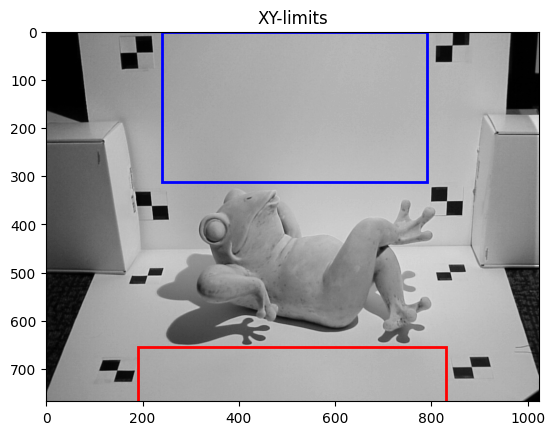

In [7]:
Imax = np.max(sequence, axis=-1)
Imin = np.min(sequence, axis=-1)

Ishadow = (Imax + Imin)/2
# plt.imshow(Imin, cmap='gray')
# plt.show()
# plt.imshow(Imax, cmap='gray')
# plt.show()
print(Ishadow.shape)
Idiff = sequence - np.expand_dims(Ishadow, axis=-1)
print(f'size of diff image: {Idiff.shape}')

fig, ax = plt.subplots()
ax.imshow(Ishadow, cmap='gray')
rect1 = patches.Rectangle((190, 654), 640, 146, linewidth=2, edgecolor='r', facecolor='none')
rect2 = patches.Rectangle((240, 0), 550, 312, linewidth=2, edgecolor='b', facecolor='none')
ax.add_patch(rect1)
ax.add_patch(rect2)
plt.title('XY-limits')
plt.savefig('showing_limits.png')
plt.show()

In [8]:
# print(Ishadow.shape)
# plt.imshow(Ishadow[654:, 190:640], cmap='gray')
# plt.show()
# plt.imshow(Ishadow[0:312, 240:550], cmap='gray')
# plt.show()

I started from this: 
Horizontal plane, i = 654 to 768, j = 190 to 190+640
<br>
Vertical plane, i = 0 to 312, j = 240 to 550

The time frames with which do not intersect with object will have no zero crossings hence not give any points. 

Important note - matplotlib reverses the order of row and column indices. 

(768, 1024, 166)
size of horizontal plane (114, 640, 166)
[0.18319098 0.18347373 0.17885549 0.17677961 0.17607275 0.16670039
 0.16865373 0.17369882]
[0.18347373 0.17885549 0.17677961 0.17607275 0.16670039 0.16865373
 0.17369882 0.18155686]


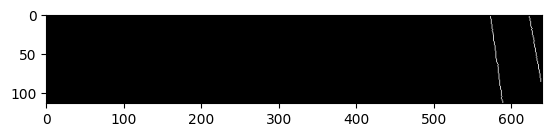

In [9]:
# horizontal plane, taking 1st edge if 2 edges on same timeframe
r0 = 654
c0 = 190
r_limit = r0 + 146
c_limit = c0 + 640

time = len(image_seq)
print(Idiff.shape)
# extracting along all ts at once
horizontal_plane = Idiff[r0:r_limit, c0:c_limit, :]
print(f'size of horizontal plane {horizontal_plane.shape}')
temp = np.zeros(horizontal_plane.shape)
temp[:, :-1, :] = horizontal_plane[:, 1:, :]

print(horizontal_plane[0, :8, 10])
print(temp[0, :8, 10])

check = np.multiply(horizontal_plane, temp)
mask = check < 0.0 
plt.imshow(mask[:, :, 140], cmap='gray')

horizontal_indices = {}
horizontal_lines = {}
for i in range(time):
    zero_crossings_mask = check[:, :, i] < 0.0
    if len(np.transpose(zero_crossings_mask.nonzero())) == 0:
        continue
    spatial = []
    rows, cols = zero_crossings_mask.shape
    for r in range(rows):
        for c in range(cols):
            if zero_crossings_mask[r, c] > 0:
                spatial.append(np.array([r, c]))
                break
    t_coordinates = np.stack(spatial, axis=0)
    num_spatial_points = len(t_coordinates)
    if num_spatial_points > 0:
        # print(len(t_coordinates), t_coordinates.shape)
        horizontal_indices[i] = t_coordinates
        
        # get the line 
        ones = np.ones((num_spatial_points, 1))
        linear_system = np.concatenate((t_coordinates, ones), axis=-1)
        u, s, vh = np.linalg.svd(linear_system, full_matrices=False)
        x = vh[-1, :]
        x = np.round(x, 3)
        horizontal_lines[i] = x
    

(768, 1024, 166)
size of vertical plane (312, 550, 166)
[0.23210137 0.22713078 0.22684412 0.22122608 0.21530255 0.21754608
 0.21252373 0.21012353]
[0.22713078 0.22684412 0.22122608 0.21530255 0.21754608 0.21252373
 0.21012353 0.21783627]


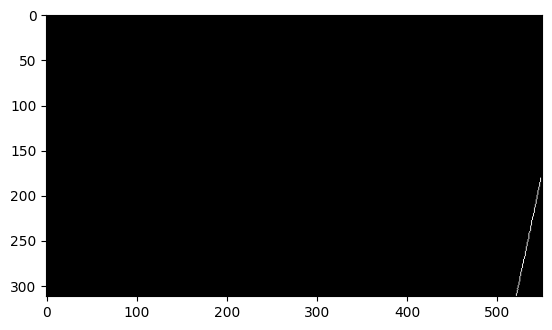

In [10]:
# vertical plane, taking 1st edge if 2 edges on same timeframe
r0 = 0
c0 = 240
r_limit = r0 + 312
c_limit = c0 + 550

time = len(image_seq)
print(Idiff.shape)
# extracting along all ts at once
vertical_plane = Idiff[r0:r_limit, c0:c_limit, :]
print(f'size of vertical plane {vertical_plane.shape}')
temp = np.zeros(vertical_plane.shape)
temp[:, :-1, :] = vertical_plane[:, 1:, :]

print(vertical_plane[0, :8, 10])
print(temp[0, :8, 10])

check = np.multiply(vertical_plane, temp)
mask = check < 0.0 
plt.imshow(mask[:, :, 140], cmap='gray')

vertical_indices = {}
vertical_lines = {}
for i in range(time):
    zero_crossings_mask = check[:, :, i] < 0.0
    if len(np.transpose(zero_crossings_mask.nonzero())) == 0:
        continue
    spatial = []
    rows, cols = zero_crossings_mask.shape
    for r in range(rows):
        for c in range(cols):
            if zero_crossings_mask[r, c] > 0:
                spatial.append(np.array([r, c]))
                break
    t_coordinates = np.stack(spatial, axis=0)
    
    num_spatial_points = len(t_coordinates)
    
    if num_spatial_points > 0:
        # print(len(t_coordinates), t_coordinates.shape)
        vertical_indices[i] = t_coordinates
    
        # fir a line to the zero crossing coordinates
        ones = np.ones((num_spatial_points, 1))
        linear_system = np.concatenate((t_coordinates, ones), axis=-1)
        u, s, vh = np.linalg.svd(linear_system, full_matrices=False)
        x = vh[-1, :]
        x = np.round(x, 3)
        vertical_lines[i] = x

114


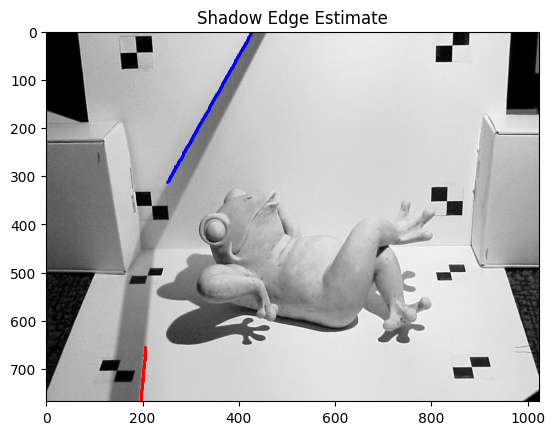

In [25]:
fig, ax = plt.subplots()
ax.imshow(sequence[:, :, 55], cmap='gray')

# plotting horizontal_indices[133]
coordinates = horizontal_indices[55]
num_points = len(coordinates)
print(num_points)
r0 = 654
c0 = 190
for p in range(num_points):
    plt.plot(c0+coordinates[p, 1], r0+coordinates[p, 0], 'o', c='red', markersize=1)

coordinates = vertical_indices[55]
num_points = len(coordinates)
r0 = 0
c0 = 240
for p in range(num_points):
    plt.plot(c0+coordinates[p, 1], r0+coordinates[p, 0], 'o', c='blue', markersize=1)

plt.title('Shadow Edge Estimate')
plt.savefig('edge2.png')
plt.show()

[[162 162 162 ...   2   0   0]
 [162 162 162 ...   0   0   0]
 [162 162 162 ...   1   1   0]
 ...
 [ 41  41  41 ...   0   0   0]
 [ 41  41  41 ...   1   1   0]
 [ 41  41  41 ...   1   1   0]]


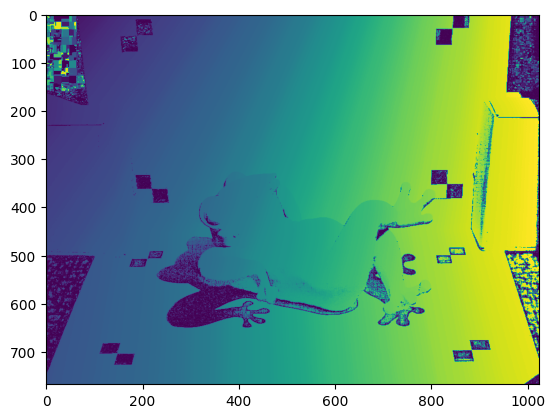

In [14]:
# per pixel shadow estimation
# zero crossing along time dimension
temp = np.zeros(Idiff.shape)
temp[:, :, :-1] = Idiff[:, :, 1:]

check = np.multiply(Idiff, temp)
mask = check < 0.0

h, w, t = sequence.shape
pixel_time = np.zeros((h, w), dtype='int')
for i in range(h):
    for j in range(w):
        pixel = np.transpose(mask[i, j, :].nonzero())
        if len(pixel) == 0:
            continue
        pixel = pixel[0]
        pixel_time[i, j] = pixel

plt.imshow(pixel_time, interpolation=None)
print(pixel_time)

[[162 162 162 ... 138  32  32]
 [162 162 162 ...  97  61  69]
 [162 162 162 ...  97 101  79]
 ...
 [ 41  41  41 ... 164  92  92]
 [ 41  41  41 ...  13  91 122]
 [ 41  41  41 ...  13  91 122]]


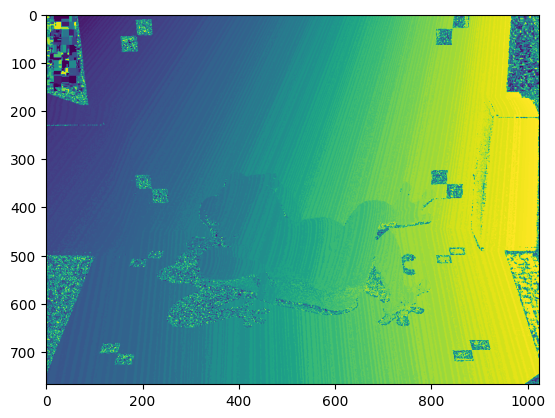

In [191]:
# per pixel shadow estimation
# zero crossing along time dimension
temp = np.zeros(Idiff.shape)
temp[:, :, :-1] = Idiff[:, :, 1:]

check = np.multiply(Idiff, temp)
pixel_time2 = np.argmin(check, axis=-1)

plt.imshow(pixel_time2, interpolation=None)
print(pixel_time2)

In [15]:
def get_x(y, a, b, c):
    return np.int(-((c + (b*y)) / (a+1.5e-3)))

/var/folders/hd/n1h1bh010cv5cm5k41bsp7y00000gp/T/ipykernel_3609/3083727589.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return np.int(-((c + (b*y)) / (a+1.5e-3)))


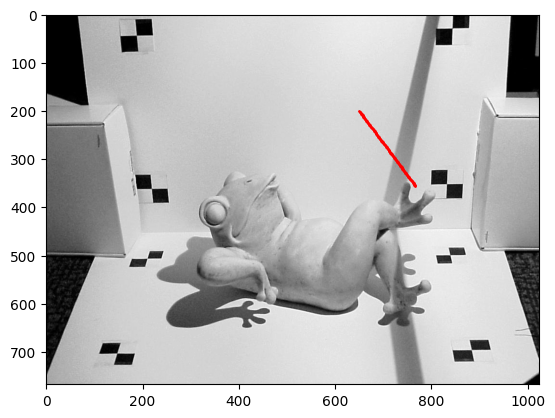

In [26]:
# plotting complete horizontal plane and vertical plane lines from a point (650, 410) - TODO
# vertical : reduce r
# horizontal : increase r

fig, ax = plt.subplots()
ax.imshow(sequence[:, :, 133], cmap='gray')

# plotting t = 133
coordinates = horizontal_indices[133]
line = horizontal_lines[133]
num_points = len(coordinates)

for r in range(650, 768, 1):
    c = get_x(r, line[0], line[1], line[2])
    plt.plot(r, c, 'o', c='red', markersize=1)

# print(num_points)
# r0 = 654
# c0 = 190
# for p in range(num_points):
#     plt.plot(c0+coordinates[p, 1], r0+coordinates[p, 0], 'o', c='red', markersize=1)

# coordinates = vertical_indices[133]
# num_points = len(coordinates)
# r0 = 0
# c0 = 240
# for p in range(num_points):
#     plt.plot(c0+coordinates[p, 1], r0+coordinates[p, 0], 'o', c='blue', markersize=1)

# plt.title('XY-limits')
# plt.savefig('wdwdwd.png')
plt.show()

In [16]:
# q1
intrinsics = np.load('data/calib/intrinsic_calib.npz')
camera_matrix = intrinsics['mtx']
distortion = intrinsics['dist']
print(f'intrinsics, camera_matrix: \n{camera_matrix}')

extrinsics = np.load('data/frog/extrinsic_calib.npz')
rmat_h = extrinsics['rmat_h']
tvec_h = extrinsics['tvec_h']
rmat_v = extrinsics['rmat_v']
tvec_v = extrinsics['tvec_v']
print(f'shape of rotation mat {rmat_h.shape}, translation vec {tvec_h.shape}')
print(f'HORIZONTAL \nrotation\n {rmat_h}, \ntranslation\n {tvec_h}')

intrinsics, camera_matrix: 
[[2.06259073e+03 0.00000000e+00 5.68921854e+02]
 [0.00000000e+00 2.06726817e+03 4.30545808e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
shape of rotation mat (3, 3), translation vec (3, 1)
HORIZONTAL 
rotation
 [[ 0.99984359  0.00558958 -0.0167793 ]
 [-0.01235179 -0.45832827 -0.88869716]
 [-0.01265787  0.88876541 -0.45818754]], 
translation
 [[-321.20923757]
 [ 207.28276038]
 [1560.14976169]]


In [17]:
def camera_to_plane_3D(P_camera, rmat, tvec):
    '''
    t vec : (3,1)
    P_camera : (3,n)
    '''
    P_plane = np.matmul(rmat.T, (P_camera - tvec))
    return P_plane

def plane_to_camera_3D(P_plane, rmat, tvec):
    rmat_inv = np.linalg.inv(rmat) # check if bug, inverse transform may not work 
    P_camera = np.matmul(rmat_inv.T, P_plane) + tvec
    return P_camera

def plane_to_camera_3D_2(P_plane, rmat, tvec):
    rmat_inv = np.linalg.inv(rmat) 
    P_camera = np.dot(rmat_inv.T, P_plane) + tvec
    return P_camera

In [18]:
def get_plane_intersection_point(plane_origin, ray_inplane_sys):
    '''
    1. note this takes in n number of rays, computes intersection point for each separately by matrix operations 
    ray_inplane_sys : (3, n)
    2. assuming both our planes have z axis orthogonal to the plane in their respective coordinate systems
    '''    
    z_origin = plane_origin[-1]
    z_ray = ray_inplane_sys[-1, :]
    dist = -z_origin / z_ray 
    dist = np.expand_dims(dist, axis=0)
 
    plane_point = plane_origin + np.multiply(dist, ray_inplane_sys)
    
    return plane_point


## Shadow line calibration

In [19]:
from src.cp_hw6 import *

In [20]:
def shadow_line_calibration(shadow_line, rmat, tvec):
    '''
    points_2d : (2,2)
    '''
    p1 = np.expand_dims(shadow_line[5], axis=0)
    p2 = np.expand_dims(shadow_line[-5], axis=0)
    points_2d = np.concatenate((p1, p2), axis=0)
    points_2d = np.float32(points_2d)

    # for rays, pass 0 vector as translation
    tvec_zero =  np.zeros((3, 1))
    rays_camera_3d = pixel2ray(points_2d, camera_matrix, distortion) # these are rays in 3D camera coordinate sys

    rays_plane_3d = camera_to_plane_3D(rays_camera_3d.squeeze().T, rmat, tvec_zero)

    # get plane's zero-coordinate 
    plane_origin = camera_to_plane_3D(tvec_zero, rmat, tvec)

    # intersect ray with horizontal plane to find intersection point P1 in plane coordinate sys
    point_plane_sys = get_plane_intersection_point(plane_origin, rays_plane_3d)

    # convert found 3d point from plane back to camera cordinate sys
#     point_camera_sys = plane_to_camera_3D(point_plane_sys, rmat, tvec)
    rmat_inv = np.linalg.inv(rmat)
    point_camera_sys = plane_to_camera_3D(point_plane_sys, rmat_inv, np.matmul(-rmat.T, tvec))
    
    return point_camera_sys
    

In [21]:
def get_plane_4points(all4_3d_points):
    # plane normal
    lh = all4_3d_points[:, 1] - all4_3d_points[:, 0]
    lv = all4_3d_points[:, 3] - all4_3d_points[:, 2]

    normal = np.cross(lh, lv)
    norm = np.linalg.norm(normal)
    normal = normal / norm # (1,3)
    normal = np.expand_dims(normal, axis=0)
    P1 = np.expand_dims(all4_3d_points[:, 0], axis=0)
    return P1, normal

In [24]:
valid_times_h = horizontal_indices.keys()
valid_times_v = vertical_indices.keys()
valid_times = []
for frame in valid_times_h:
    if frame in valid_times_v:
        valid_times.append(frame)
valid_times = np.stack(valid_times)

print(f'valid times {valid_times}')
reconstructed_3d_points = {}
shadow_planes = {}

for t in valid_times:
    # for each time frame
    # selecting 2 random points from both planes
    h_shadow_line = horizontal_indices[t]
    h_cmaera3d_points = shadow_line_calibration(h_shadow_line, rmat_h, tvec_h)
    v_shadow_line = vertical_indices[t]
    v_cmaera3d_points = shadow_line_calibration(v_shadow_line, rmat_v, tvec_v)

    all4_3d_points = np.concatenate((h_cmaera3d_points, v_cmaera3d_points), axis=1) # (3,4)
    # print(all4_3d_points.shape)
    reconstructed_3d_points[t] = all4_3d_points
    
    P1, normal = get_plane_4points(all4_3d_points)
    
    shadow_planes[t] = np.concatenate((P1, normal), axis=0)
    
# saving as npz file 
np.savez('reconstructed_3d.npz', reconstructed_3d_points)
np.savez('shadow_planes.npz', shadow_planes)
print(len(reconstructed_3d_points))
print(len(shadow_planes))

# get hor and ver plane normal and point for plotting 
h_shadow_line1 = horizontal_indices[55]
h_shadow_line2 = horizontal_indices[117]
h_cmaera3d_points1 = shadow_line_calibration(h_shadow_line1, rmat_h, tvec_h)
h_cmaera3d_points2 = shadow_line_calibration(h_shadow_line2, rmat_h, tvec_h)

all4_3d_hor = np.concatenate((h_cmaera3d_points1, h_cmaera3d_points2), axis=1) # (3,4)

P1_hor, normal_hor = get_plane_4points(all4_3d_hor)

# sdedewd
v_shadow_line1 = vertical_indices[55]
v_shadow_line2 = vertical_indices[117]
v_cmaera3d_points1 = shadow_line_calibration(v_shadow_line1, rmat_v, tvec_v)
v_cmaera3d_points2 = shadow_line_calibration(v_shadow_line2, rmat_v, tvec_v)

all4_3d_ver = np.concatenate((v_cmaera3d_points1, v_cmaera3d_points2), axis=1) # (3,4)

P1_ver, normal_ver = get_plane_4points(all4_3d_ver)


valid times [ 54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142]
89
89


[[  194.39632364   286.37548448   427.36758653   438.18323461]
 [-1359.82404709 -1347.60634159  1010.33331169  1008.21455419]
 [  761.96864586   783.12682417  1574.63006595  1575.44751863]]


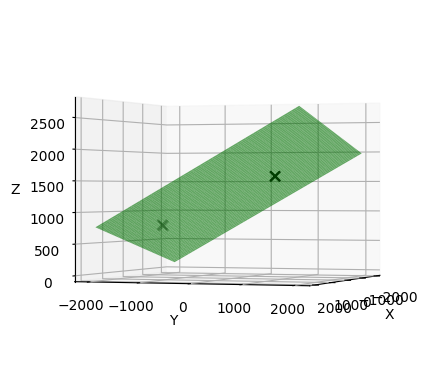

[[  194.39632364   286.37548448   427.36758653   438.18323461]
 [-1359.82404709 -1347.60634159  1010.33331169  1008.21455419]
 [  761.96864586   783.12682417  1574.63006595  1575.44751863]]


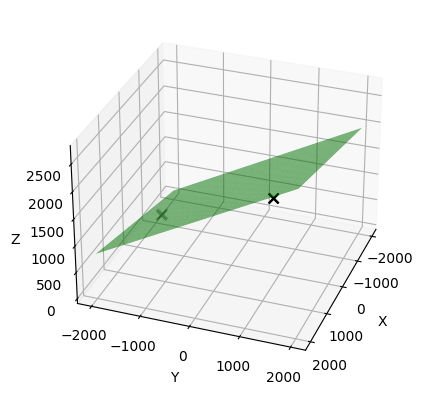

[[  194.39632364   286.37548448   427.36758653   438.18323461]
 [-1359.82404709 -1347.60634159  1010.33331169  1008.21455419]
 [  761.96864586   783.12682417  1574.63006595  1575.44751863]]


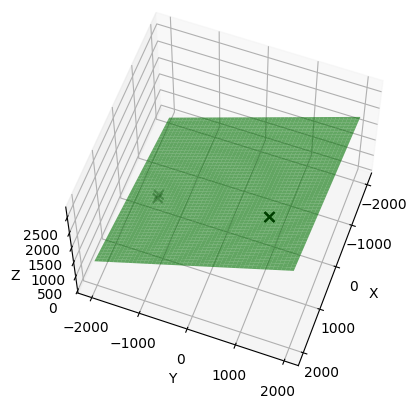

[[  194.39632364   286.37548448   427.36758653   438.18323461]
 [-1359.82404709 -1347.60634159  1010.33331169  1008.21455419]
 [  761.96864586   783.12682417  1574.63006595  1575.44751863]]


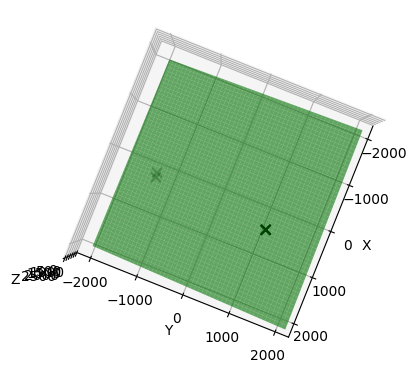

[[  194.39632364   286.37548448   427.36758653   438.18323461]
 [-1359.82404709 -1347.60634159  1010.33331169  1008.21455419]
 [  761.96864586   783.12682417  1574.63006595  1575.44751863]]


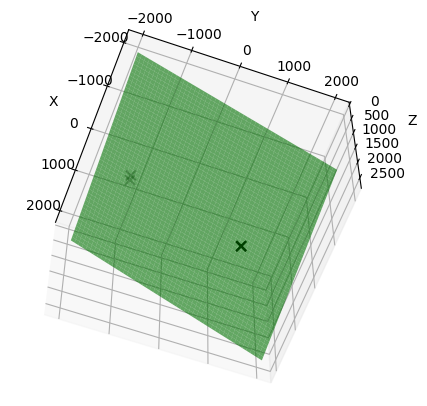

[[  194.39632364   286.37548448   427.36758653   438.18323461]
 [-1359.82404709 -1347.60634159  1010.33331169  1008.21455419]
 [  761.96864586   783.12682417  1574.63006595  1575.44751863]]


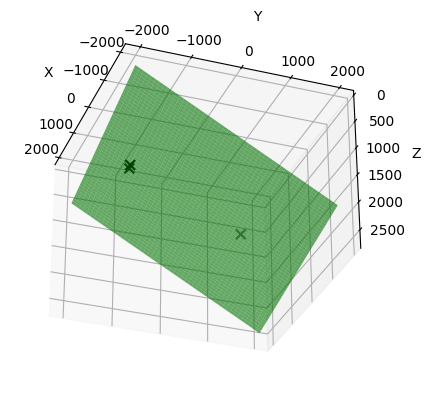

In [495]:
# import PyQt5
    # %matplotlib qt
%matplotlib inline 

for i in range(0, 180, 30):
    fig = plt.figure()
    ax = fig.add_subplot(111,projection='3d')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.view_init(elev=i, azim=20)
    print(all4_3d_points)
    #     =============
    
    # this is 4 point plane
    d = -P1.dot(normal.T)
    xx, yy = np.meshgrid(range(-2000, 2000), range(-2000, 2000))
    z = (-normal[0, 0] * xx - normal[0, 1] * yy - d) * 1. /normal[0, 2]
    
    # this is hori plane
    d_hor = -P1_hor.dot(normal_hor.T)
    xx1, yy1 = np.meshgrid(range(-2000, 2000), range(-2000, 2000))
    z1 = (-normal_hor[0, 0] * xx1 - normal_hor[0, 1] * yy1 - d_hor) * 1. /normal_hor[0, 2]
    
    # this is hori plane
    d_ver = -P1_ver.dot(normal_hor.T)
    xx2, yy2 = np.meshgrid(range(-2000, 2000), range(-2000, 2000))
    z2 = (-normal_ver[0, 0] * xx2 - normal_ver[0, 1] * yy2 - d_ver) * 1. /normal_ver[0, 2]

    ax.plot_surface(xx, yy, z, alpha=0.6, label='all4', color='g')
#     ax.plot_surface(xx1, yy1, z1, alpha=0.6, label='horizontal', color='b')
#     ax.plot_surface(xx2, yy2, z2, alpha=0.6, label='vertical', color='r')
    
    ax.scatter(all4_3d_points[0, :], all4_3d_points[1, :], all4_3d_points[2, :], s=50, c='black', cmap='gray', marker='x')

    plt.show()

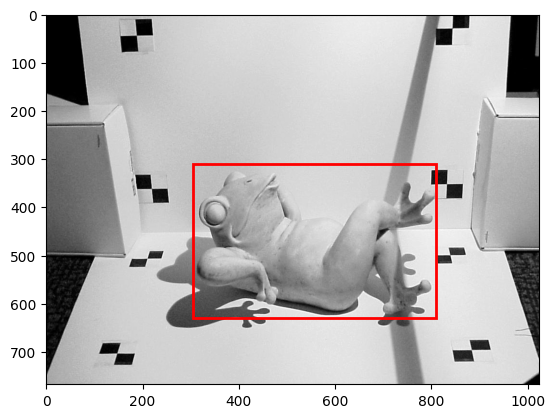

In [419]:
fig, ax = plt.subplots()
ax.imshow(sequence[:, :, 133], cmap='gray')

rect1 = patches.Rectangle((305, 310), 505, 320, linewidth=2, edgecolor='r', facecolor='none')
ax.add_patch(rect1)
plt.show()

In [486]:
def find_intersection(ray, plane):
    P0 = np.expand_dims(plane[0, :], axis=0)
    normal = np.expand_dims(plane[1, :], axis=1)
    ray = np.squeeze(ray, 1)
    '''
    P0 (1, 3), normal (3, 1), ray (1, 3)
    '''    
    scale_d = np.dot(P0, normal) / np.dot(ray, normal)
    point_on_plane = ray * scale_d
    return point_on_plane

render crop limits - cols: (290 to 820), rows : (310 to 640)

new range 
<br>
render crop limits - cols: (305 to 810), rows : (310 to 630)

function pixel2ray() requires float array

In [487]:
# get shadow time for each pixel, reconstruct it
valid_times = shadow_planes.keys()
final_3d_points_render = []
color = []
X_3d = []
Y_3d = []
Z_3d = []
for r in range(310, 630):
    for c in range(305, 810):
        structure = []
        time = pixel_time[r, c]
        if time not in valid_times:
            continue
        if Icontrast[r, c] < 0.32:
            continue # remove potential outliers/object shadow pix
        plane = shadow_planes[time]
        point_2d = np.array([[r, c]], dtype='float32') 
        ray = pixel2ray(point_2d, camera_matrix, distortion)
        object_point_camera3d = find_intersection(ray, plane)
        
        # points_2d.append(np.array([[r, c]])) # (1,2) 2d point
        X_3d.append(object_point_camera3d[0, 0]) 
        Y_3d.append(object_point_camera3d[0, 1])
        Z_3d.append(object_point_camera3d[0, 2]) 
        color.append(sequence[r, c, time]) # 2d pixel color 
        
X_render = np.stack(X_3d, axis=0)
Y_render = np.stack(Y_3d, axis=0)
Z_render = np.stack(Z_3d, axis=0)
color_render = np.stack(color, axis=0)

In [488]:
# with outlier removal
num_points = len(X_render)
print(num_points)
xmin = X_render.min()
xmax = X_render.max()
ymin = Y_render.min()
ymax = Y_render.max()
zmin = Z_render.min()
zmax = Z_render.max()
print(xmax, xmin, ymax, ymin, zmax, zmin)

print(color_render.min(), color_render.max(), color_render.mean())

# color_render = (color_render - color_render.min()) / (color_render.max() - color_render.min())

70330
921.2814903660844 -168.82447309272314 410.5862357254051 -77.42797881002649 1488.8908522568302 -7318.198483466784
0.2609278431372549 0.9988690196078431 0.67002184860169


In [490]:
# removing outliers based on pixel specific contrast across time frames
Imin = np.min(sequence, axis=-1)
Imax = np.max(sequence, axis=-1)
Icontrast = Imax - Imin
print(Icontrast.min(), Icontrast.max())


0.0 0.7702949019607844


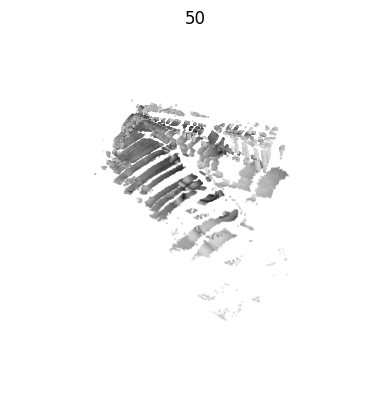

In [491]:
# import PyQt5
# %matplotlib qt
%matplotlib inline 

# for a in range(-60, 60, 10):
fig = plt.figure("Projected camera view")
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
# dX = 558.8  
# dY = 303.2125
DX = 3
DY = 3
#     ax.plot([0, DX, DX, 0, 0], [0, 0, DY, DY, 0])
ax.view_init(elev=100, azim=20)
plt.title(str(a))

ax.set_xlim3d(left=xmin, right=xmax) 
ax.set_ylim3d(bottom=ymin, top=ymax) 
ax.set_zlim3d(bottom=zmin, top=zmax) 
plt.axis('off')

ax.scatter(X_render, Y_render, Z_render, s=0.1, c=color_render, cmap='gray')

#     ax.set_box_aspect([1, 1, 1])
#     set_axes_equal(ax)
plt.show()

In [410]:
import plotly.graph_objects as go
trace = go.Scatter3d(x=X_render, y=Y_render, z=Z_render, marker=dict(size=1, color=color_render))

layout = go.Layout(title='Plotly Scatter Plot')


fig = go.Figure(data=[trace], layout=layout)
fig.show()